## **1- Preparación del Entorno del Proyecto YoloV8**


In [8]:
# PREPARANDO EL ENTORNO CON LAS LIBRERIAS
!pip install torch torchvision torchaudio
!pip install opencv-python
!pip install ultralytics
!pip install albumentations
!pip install tensorboard
!pip install pycocotools
!pip install json
!pip install tqdm
!pip install tensorboard

ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
import os          # IMPORTANDO LAS LIBRERIAS
import urllib.request
import zipfile
import numpy as np
import json
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pycocotools.coco import COCO
import requests
import zipfile
from tqdm import tqdm
from IPython.display import Image as IPyImage
from PIL import Image
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## **2 - Recolección de los datos**

### Comentarios:
* EL conjunto de de datos trabajado fue PASCAL VOC debido a que era menos pesado que el recomendado que era COCO.

* Este conjunto de datos fue descargado de la pagina Roboflow debido a que lo ofrecia ya que lo tenia disponible y con las anotaciones en txt lo cual facilitaba el proceso.

In [11]:
# Descomponiendo la carpeta zip con los datos
!unzip -q "/content/Dataset.zip" -d "/content/Dataset"

### **Exploración de algunas imagenes para conocer un pocos mas el conjunto de datos**

In [12]:
# CREACION DE UNA LISTA DE LAS IMAGENES DE LAS CARPPETA PARA PODER VISUALIZAR ALGUNAS
ruta_imagenes = "/content/Dataset/Dataset/Prueba/train/images"
lista_imagenes_train = [
    os.path.join(ruta_imagenes, f)
    for f in os.listdir(ruta_imagenes)
    if f.lower().endswith(('.png', '.jpg', '.jpeg')) # Filtra solo archivos de imagen
]

In [13]:
# CREANDO UNS FUNCION PARA VISUALIZAR IMAGEN
def visualizar_imagenes(imagen):
    image_path = imagen
    image = cv2.imread(image_path)
    image = cv2.resize(image, (640, 640))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title("Imagen")
    plt.show()

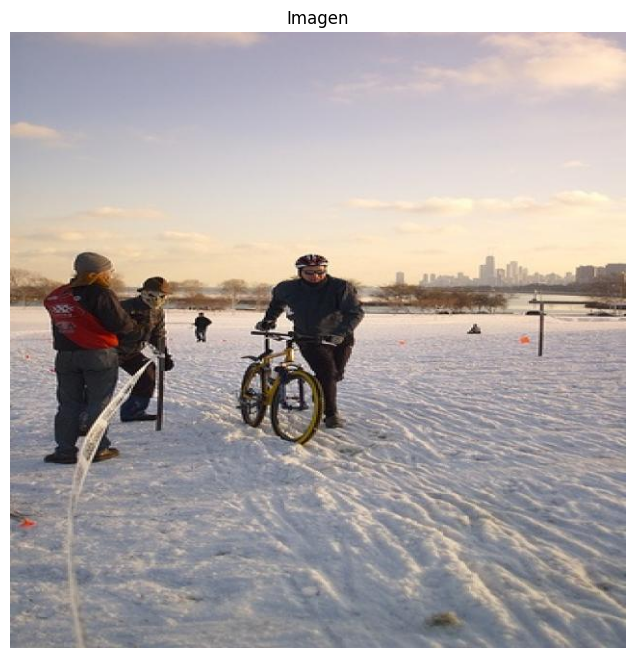

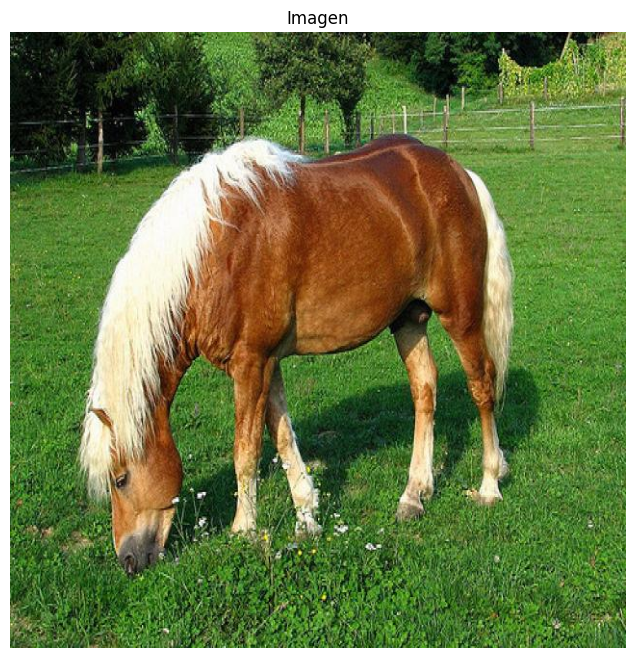

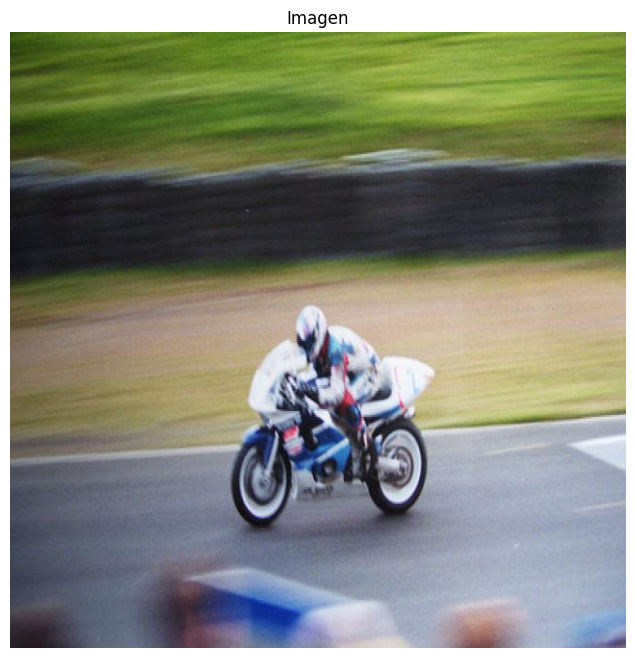

In [14]:
#CREANDO CICLO FOR PARA INTERAR SOBRE LA LISTA DE IMAGENES
for lista in lista_imagenes_train[0:3]:
    visualizar_imagenes(lista)

## **3 - Conversión de las anotaciones del conjunto de datos**

### Comentarios:

* No se realizaron las conversiones debido a que desde la pagina de la cual fueron descargadas tenian el proceso, sin embargo entiendo que no tiene ninguna complicación, en otra oportunidad se realizará.

## **4 - Transformación y Aumento de Datos**

### Comentarios:

* Dada la cantidad de datos y el mantenimiento previo del conjunto de datos, entendia que no era necesarios. En cuanto a la normalizacion el modelo YoloV8 automaticamente normaliza los datos y en cuando el redimencionamiento puede ser tratado por medio del parametro imgsz al momento de entrenarlo.

## **5- Entrenamiento del Modelo**

### Comentario:

* Se creo una instancia del modelo YoloV8 nano, el mas pequeno de todo en cuanto a paramentros para poder realizar el proceso mas rapido.
* Se configuro el parametro con 10 iteraciones.
* Se configuro el parametro imasz para que el tamano de las fotos de 640, el limite recomendado.
* Se configuro el parametro plots para ver los resultados y proceso de entrenamiento del modelo.

In [15]:
# Creando la instancia del modelo Yolo
model = YOLO('yolov8n.pt')

In [17]:
# Afinar el modelo
results = model.train(data="/content/Dataset/Dataset/Prueba/datag.yaml",
                      epochs=10, # Número de iteraciones
                      imgsz=640, # Tamaño de las imágenes (máxima dimensión)
                      plots=True, # Guardar gráficos de entrenamiento
                      )

Ultralytics 8.3.204 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Dataset/Dataset/Prueba/datag.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plo

## **6- Evaluación del Modelo**

### Comentarios:

* En el primer grafico podemos ver algunas metricas como box_loss la cual nos dice que tan bueno es modelo ubicando los objetos. Se puede observar que tanto en validacion como en entrennamieto tiene resultados parecidos los cual nos indica que no tenemos sobreajuste. Tambien podemos observar que la cls_loss tiene un buen comportamiento, esta metricas nos dices que tan bien el modelo clasifica los objetos. En la metricas precsion y recall la tendencia sigue se ve creciente, indicando que el modelo esta mejorando sus predicciones a nivel general como con los casos poisitivos.

* En el segundo grafico que es la matrix confusion noramlizada, podemos ver en promedio entre 70% y 80% de precision clasificando bien. Vemos que con la clase persona, gatos y autobus tiene un alto rendimiento acertando su clasificacion.La clase la cual tiene un margen de mejoria son con los objetos sillas, al parecer no lo reconoce muy bien.

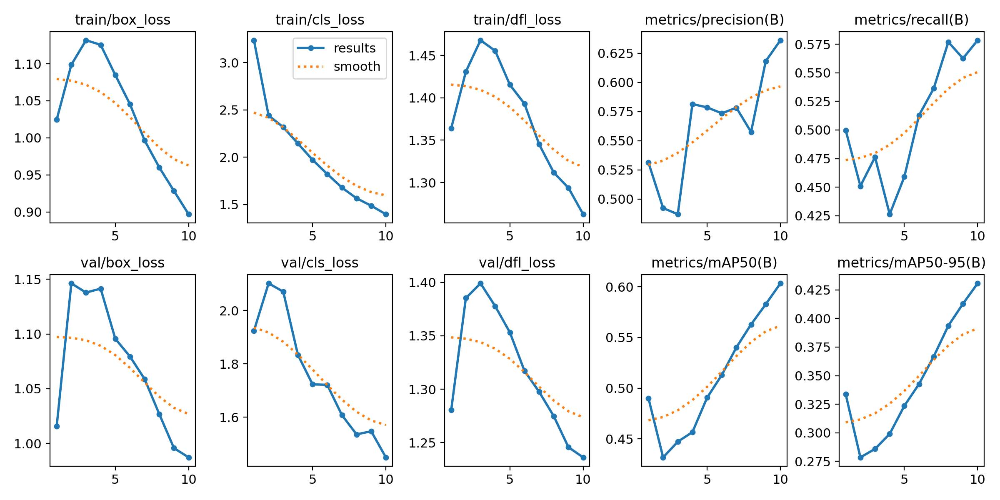

In [18]:
# Revisando los graficos de rendimiento
IPyImage(filename='/content/runs/detect/train2/results.png', width=1000)

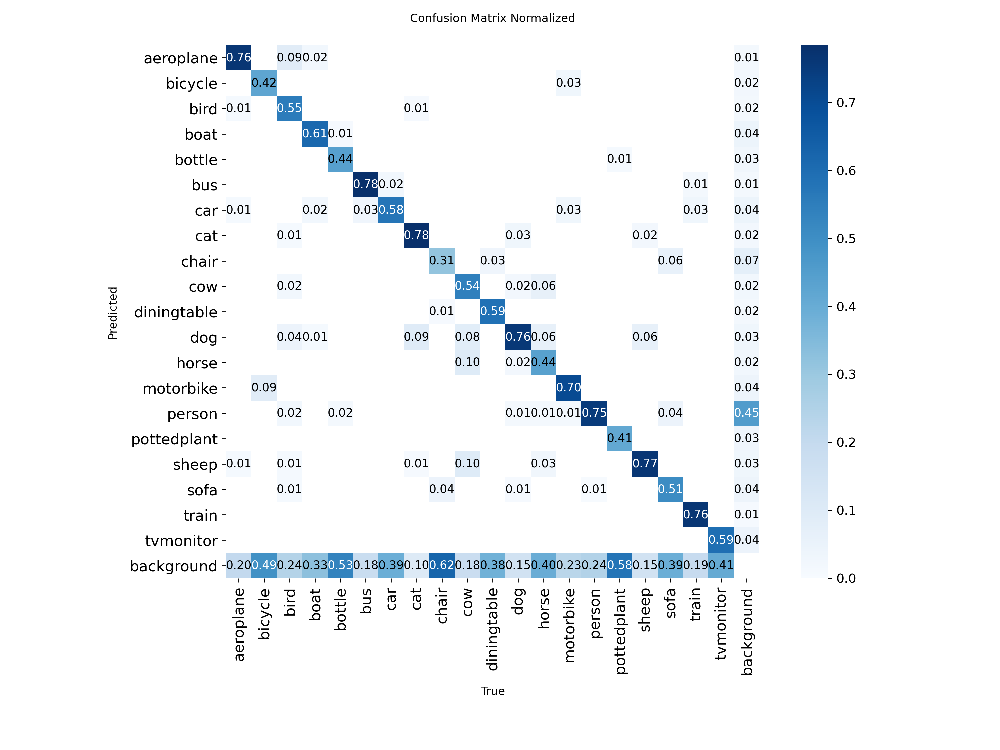

In [19]:
# Revisando la matrix de confusion
IPyImage(filename='/content/runs/detect/train2/confusion_matrix_normalized.png', width=1000)

## **7- Inferencia con Imagenes Nuevas**

### Comentario:

* Se selecciono el mejor modelo arrojado de todas las epocas durante el entrenamiento el cual se encuentra en la carpeta best. Luego se realizaron las inferencias con las imagenes de prueba.

In [20]:
# Seleccionando el modelo con mejor rendimiento
model = YOLO('/content/runs/detect/train2/weights/best.pt')

In [21]:
# Realizando prediccion con el mejor modelo
preds = model('/content/Dataset/Dataset/Prueba/test/images')


image 1/737 /content/Dataset/Dataset/Prueba/test/images/2007_000256_jpg.rf.db54e32decfe3e30a400540b9ab198b7.jpg: 640x640 1 aeroplane, 8.2ms
image 2/737 /content/Dataset/Dataset/Prueba/test/images/2007_000584_jpg.rf.a41e029099b90681f780aebdab504bf6.jpg: 640x640 1 bicycle, 1 sofa, 11.5ms
image 3/737 /content/Dataset/Dataset/Prueba/test/images/2007_000713_jpg.rf.6c9ab8b99053560995a07564ddee58e0.jpg: 640x640 3 boats, 9.1ms
image 4/737 /content/Dataset/Dataset/Prueba/test/images/2007_001225_jpg.rf.7e6b4bbcb569d88c2ecaac2bbfd4f344.jpg: 640x640 1 dog, 9.9ms
image 5/737 /content/Dataset/Dataset/Prueba/test/images/2007_001458_jpg.rf.c164de8c6aaca883dd48dc873f866ff8.jpg: 640x640 1 sofa, 11.5ms
image 6/737 /content/Dataset/Dataset/Prueba/test/images/2007_001602_jpg.rf.7898a4145b5645cf3880811ddb9f74d4.jpg: 640x640 5 bottles, 1 car, 15.1ms
image 7/737 /content/Dataset/Dataset/Prueba/test/images/2007_001763_jpg.rf.bf8cb5eb9a2868ee09260672abbd992a.jpg: 640x640 2 cats, 1 dog, 10.0ms
image 8/737 /cont

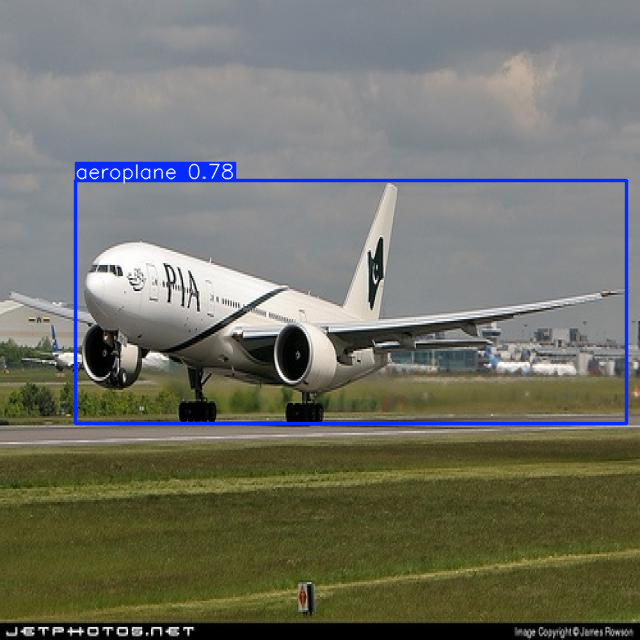

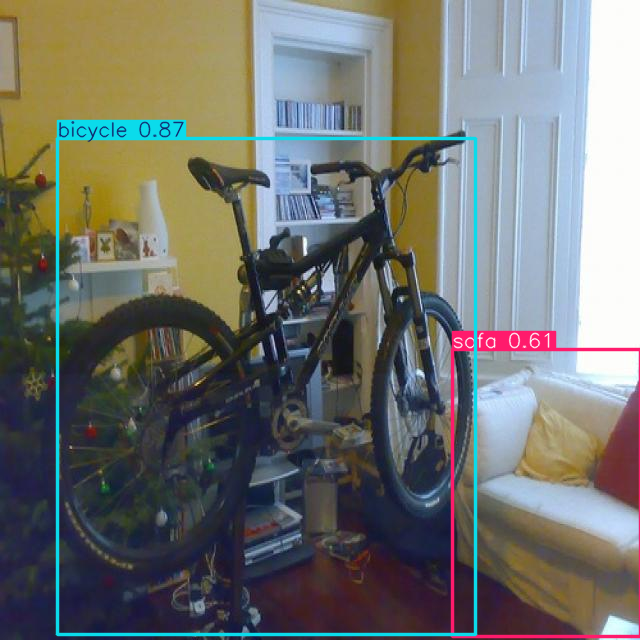

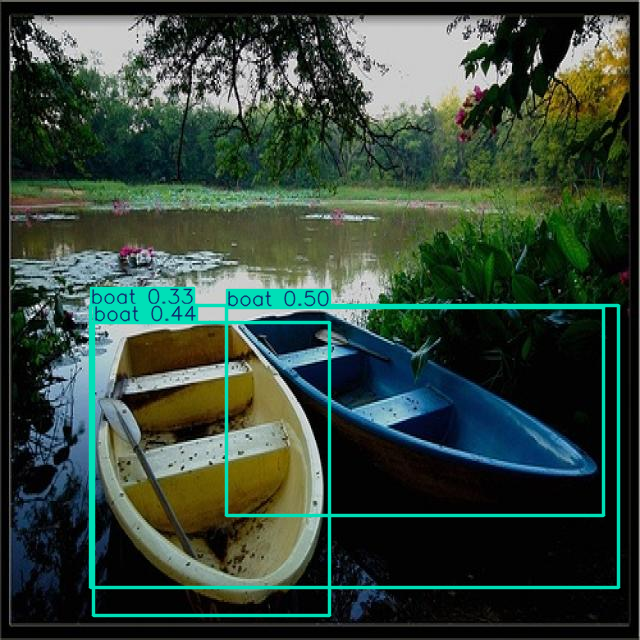

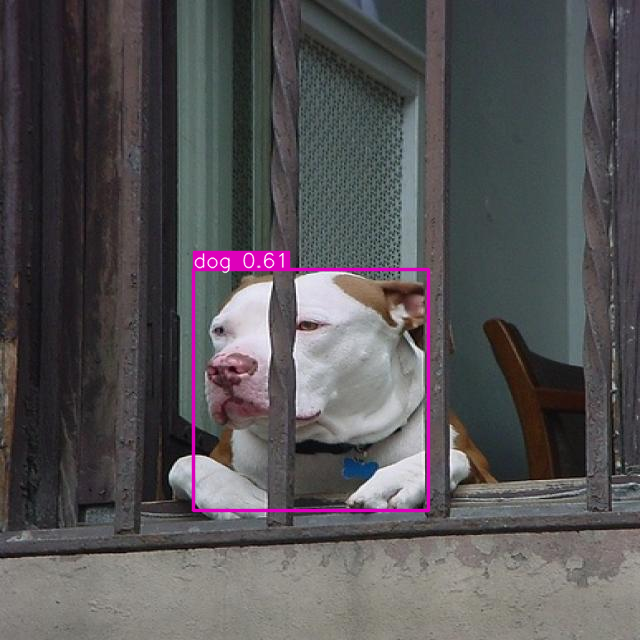

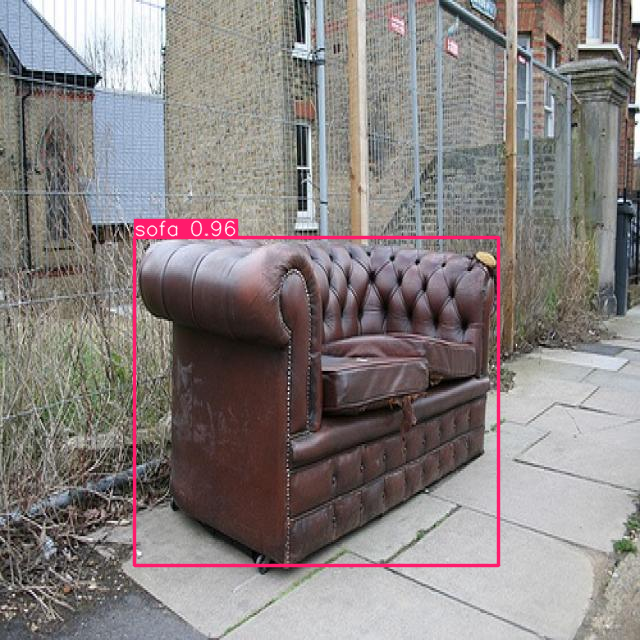

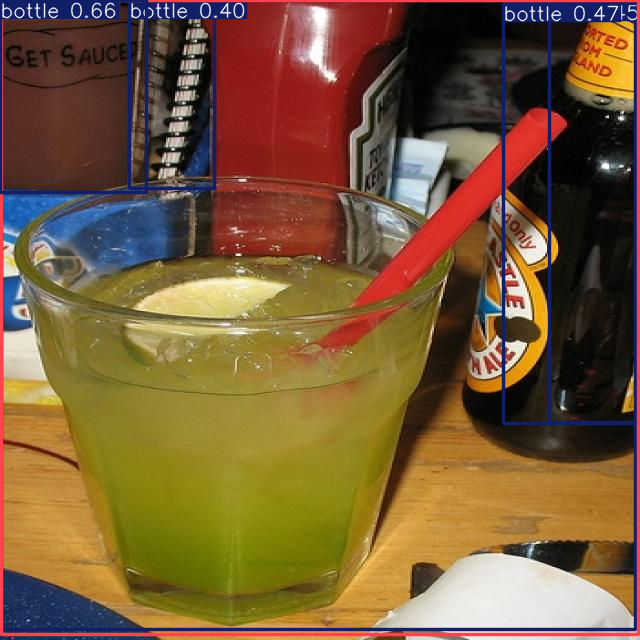

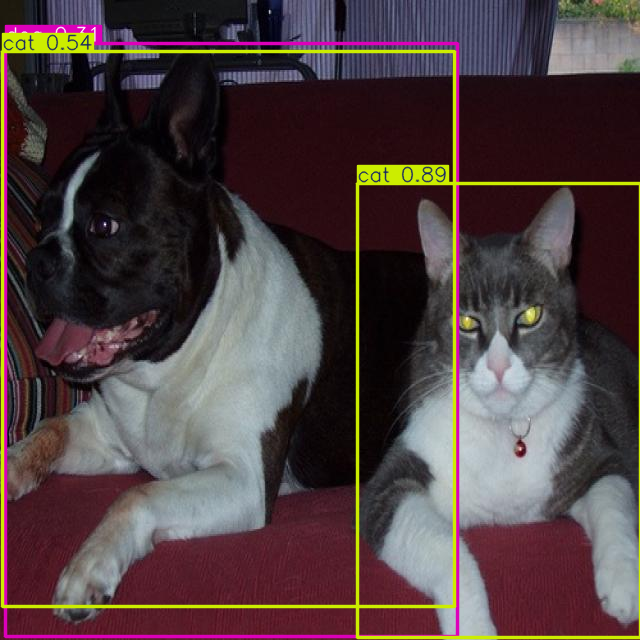

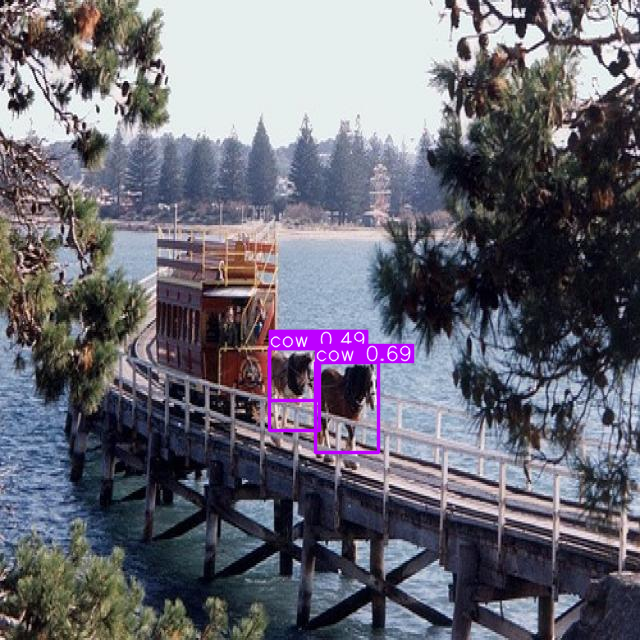

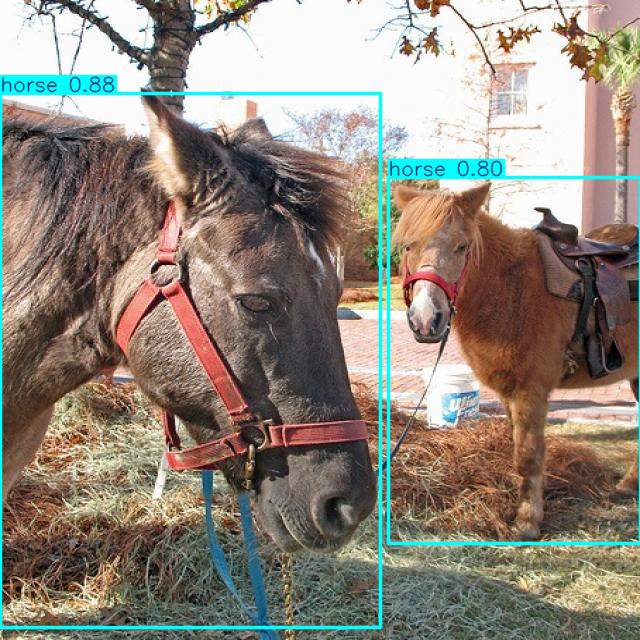

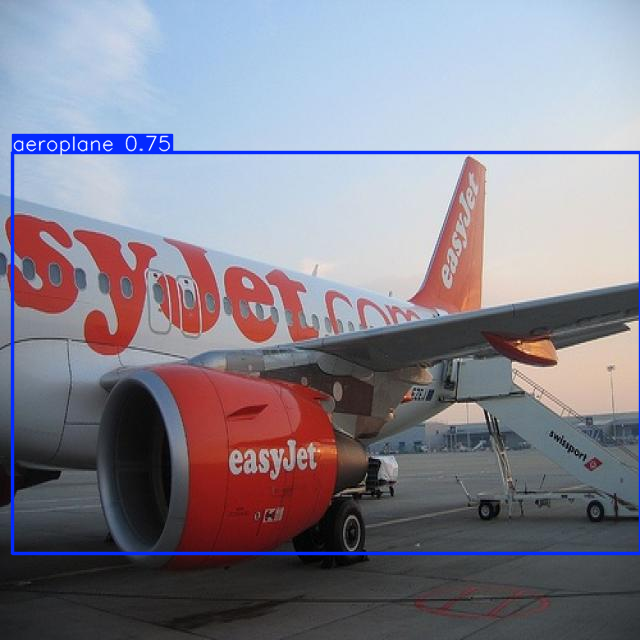

In [22]:
# Realizando predicciones del mejor modelo
for i in range(10):
  preds[i].show()

## **8- Guardar y Cargar el Modelo**

In [23]:
# Guardar el modelo
model.save('yolov8_entrenado_model.pt')

# Cargar el modelo guardado
model_loaded = YOLO('yolov8_entrenado_model.pt')